In [ ]:

!pip install -U fastai

import fastai
print(fastai.__version__)


2.7.18


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
from zipfile import ZipFile

zip_path = '/content/drive/My Drive/Disaster_Images.zip' 
extract_path = '/content/Disaster_Images'

if not os.path.exists(extract_path):
    os.makedirs(extract_path)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Unzipping completed.")


Unzipping completed.


In [ ]:
import os
import shutil

main_folder = '/content/Disaster_Images'
nested_folder = '/content/Disaster_Images/Disaster_Images'

if os.path.exists(nested_folder):
    for item in os.listdir(nested_folder):
        item_path = os.path.join(nested_folder, item)
        shutil.move(item_path, main_folder)
    os.rmdir(nested_folder)

print("Folder structure after reorganization:")
!ls -R /content/Disaster_Images


Folder structure after reorganization:
/content/Disaster_Images:
Avalanche  Earthquake  Fire  Flood  Landslide  Tornado

/content/Disaster_Images/Avalanche:
 01765r.jpeg
 01-avalanche-reference_3x4.jpeg
 11.5.jpeg
 1200-675-21675903-748-21675903-1717992939767.jpeg
 120934055_e5e5be76a7_k.jpeg
 1613133301-4292.jpeg
 17af24a2f43b08e3f3b02aa8d2f0e0ff.jpeg
 193021841-giant-avalanche-in-mountain-closeup-huge-powerful-snowslide-snow-dust-flowing-down-from-rock-summit.jpeg
 1-indian-himalayas-avalanche.jpeg
 20210411-_dsc2337_2000x1100.jpeg
 21_04_2024-avalanche_in_nepal_23701634.jpeg
'220px-Alaska_-_Miscellaneous_(Airscapes)_-_NARA_-_23933547.jpeg'
'220px-Lawinenkegel_auf_dem_Simplonpass_(2019).jpeg'
 220px-Ligne_Saint-Gervais_-_Vallorcine_-_avalanche_2006_-_08.jpeg
 25-die-Wildbach_Vorarlberg_002.jpeg
 27795_square.jpeg
 301_3x4.jpeg
 30_16x9.jpeg
 4ecbd2cc-1735-4b59-b938-e8ec9ab33e0f.jpeg
 560642d668e9f8a5e62b1ee6772cbefa.jpeg
 6-avalanche-when-snow-become-deadly.jpeg
 7-avalanche-when-sno

In [ ]:

from fastai import *
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from fastai.vision.all import *

In [ ]:

path = Path('/content/Disaster_Images')  

path.ls()


(#6) [Path('/content/Disaster_Images/Avalanche'),Path('/content/Disaster_Images/Tornado'),Path('/content/Disaster_Images/Flood'),Path('/content/Disaster_Images/Earthquake'),Path('/content/Disaster_Images/Landslide'),Path('/content/Disaster_Images/Fire')]

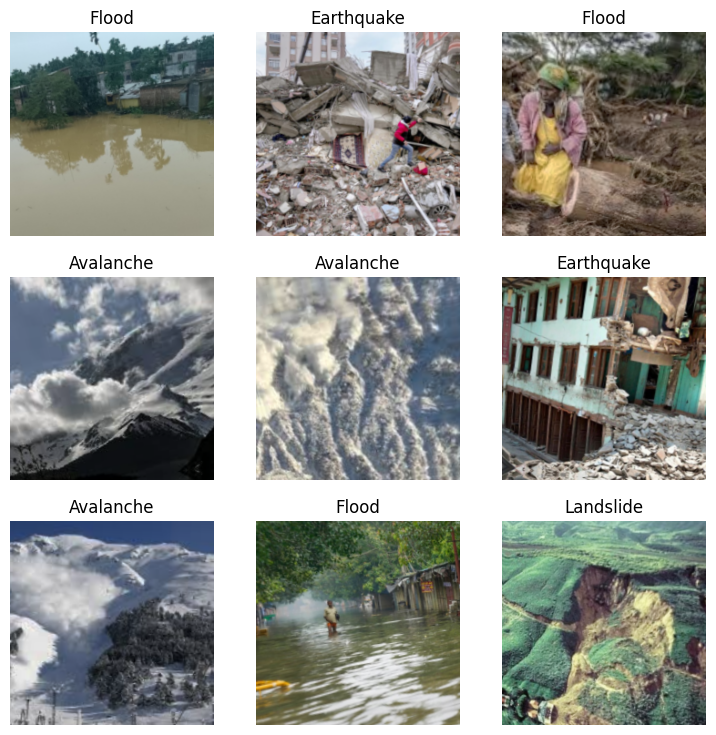

In [ ]:

set_seed(40, reproducible=True)

dls = ImageDataLoaders.from_folder(
    path,
    train='.',
    valid_pct=0.2,
    item_tfms=Resize(224),
    batch_tfms=[*aug_transforms(), Normalize.from_stats(*imagenet_stats)], 
    seed=40
)

dls.show_batch(nrows=3, ncols=3)


In [ ]:
print("Classes:", dls.vocab)
print("Number of classes:", len(dls.vocab))


Classes: ['Avalanche', 'Earthquake', 'Fire', 'Flood', 'Landslide', 'Tornado']
Number of classes: 6


In [ ]:

learn = cnn_learner(
    dls,
    resnet18,
    metrics=accuracy,
    path=path,
    model_dir=path/'models'
)

learn


/usr/local/lib/python3.10/dist-packages/fastai/vision/learner.py:303: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 86.6MB/s]


/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

SuggestedLRs(valley=0.0010000000474974513)

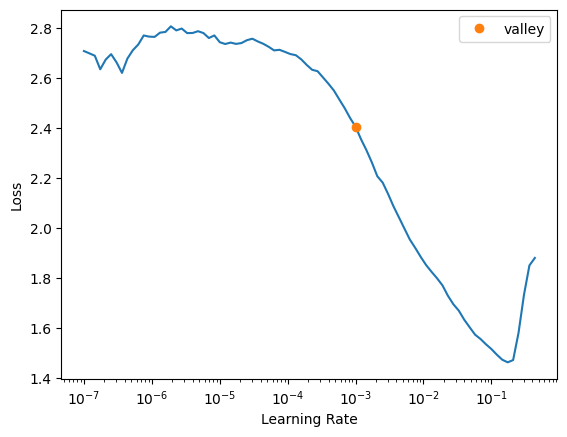

In [ ]:

learn.lr_find()


In [ ]:

lr = 1e-3

learn.fit_one_cycle(40, lr)


epoch,train_loss,valid_loss,accuracy,time
0,2.341483,1.306125,0.528146,00:56
1,1.705516,0.645457,0.773179,01:03
2,1.176994,0.381904,0.875828,00:56
3,0.822962,0.305997,0.902318,00:57
4,0.612631,0.279728,0.905629,01:02
5,0.473279,0.255610,0.923841,00:56
6,0.387042,0.251814,0.928808,00:57
7,0.309697,0.244230,0.928808,01:02
8,0.293915,0.242088,0.928808,00:56
9,0.262776,0.260965,0.928808,00:56


<Axes: title={'center': 'learning curve'}, xlabel='steps', ylabel='loss'>

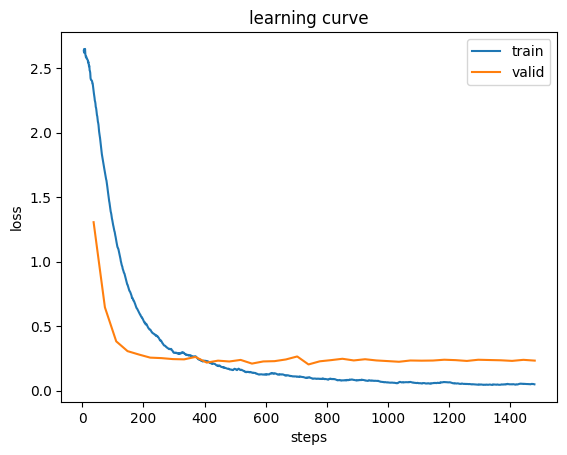

In [ ]:
learn.recorder.plot_loss()


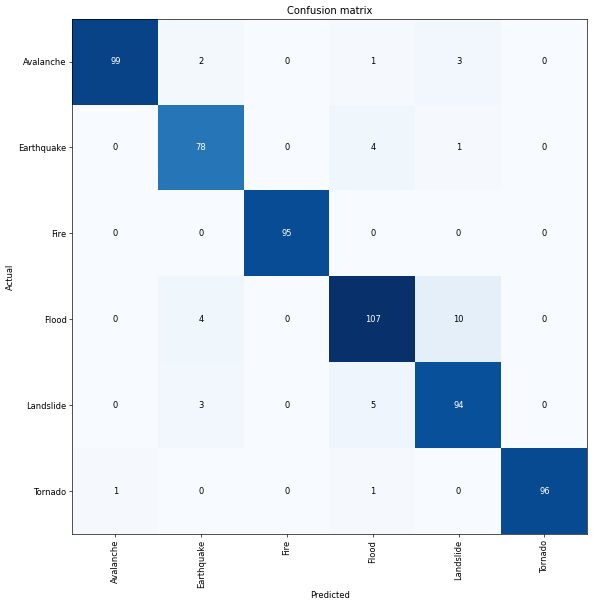

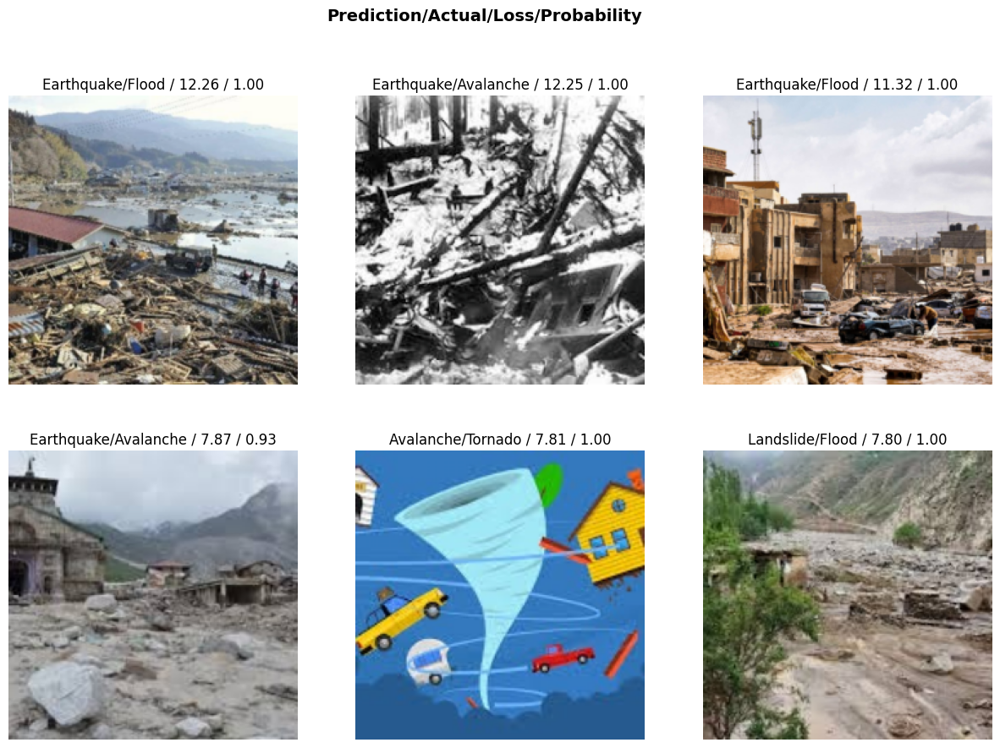

In [ ]:

interp = ClassificationInterpretation.from_learner(learn)


interp.plot_confusion_matrix(figsize=(10,10), dpi=60)

# Plot top 6 losses
interp.plot_top_losses(6, figsize=(15,10))


In [ ]:

from google.colab import files
uploaded = files.upload()

Saving test_image2.jpeg to test_image2.jpeg


In [ ]:

img_path = '/content/test_image2.jpeg' 
img = PILImage.create(img_path)
pred_class, pred_idx, outputs = learn.predict(img)
print(f"Predicted Class: {pred_class}")


Predicted Class: Avalanche


In [ ]:
# Export the trained model
learn.export(fname = path/'export.pkl')
print("Model exported successfully.")


Model exported successfully.


In [ ]:
# Unfreeze the model for fine-tuning
learn.unfreeze()

learn.fit_one_cycle(20, slice(1e-4, 1e-3))


epoch,train_loss,valid_loss,accuracy,time
0,0.049762,0.256109,0.942053,00:55
1,0.050831,0.313108,0.937086,00:56
2,0.107680,0.322348,0.913907,01:02
3,0.135930,0.336864,0.917219,00:55
4,0.150148,0.348630,0.925497,00:55
5,0.135612,0.280152,0.927152,01:01
6,0.115791,0.250487,0.948676,00:57
7,0.099473,0.295266,0.932119,00:57
8,0.095174,0.281035,0.937086,01:02
9,0.083010,0.303627,0.930464,00:56


<Axes: title={'center': 'learning curve'}, xlabel='steps', ylabel='loss'>

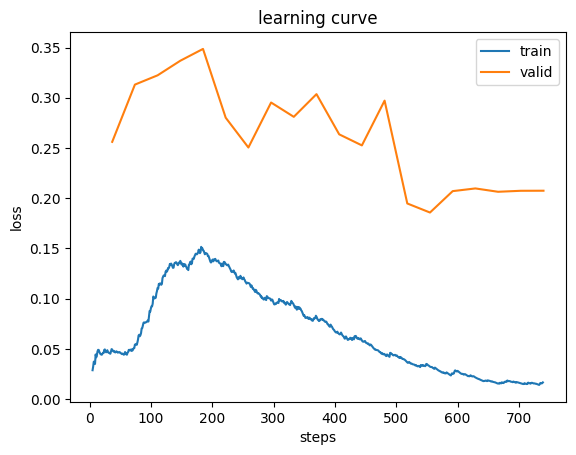

In [ ]:
learn.recorder.plot_loss()


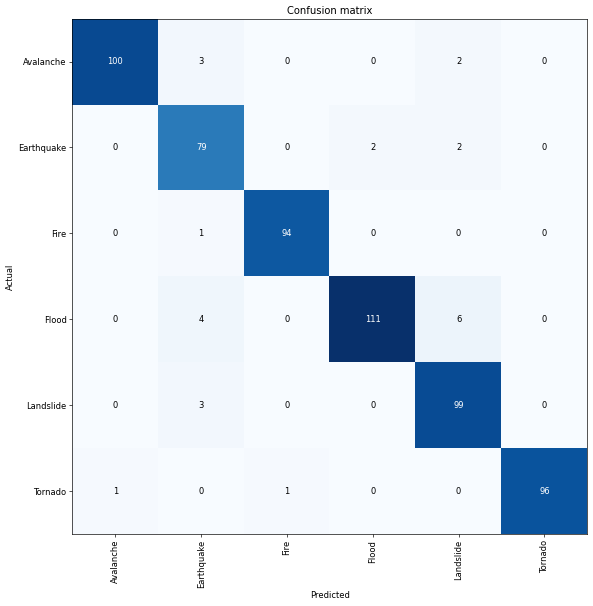

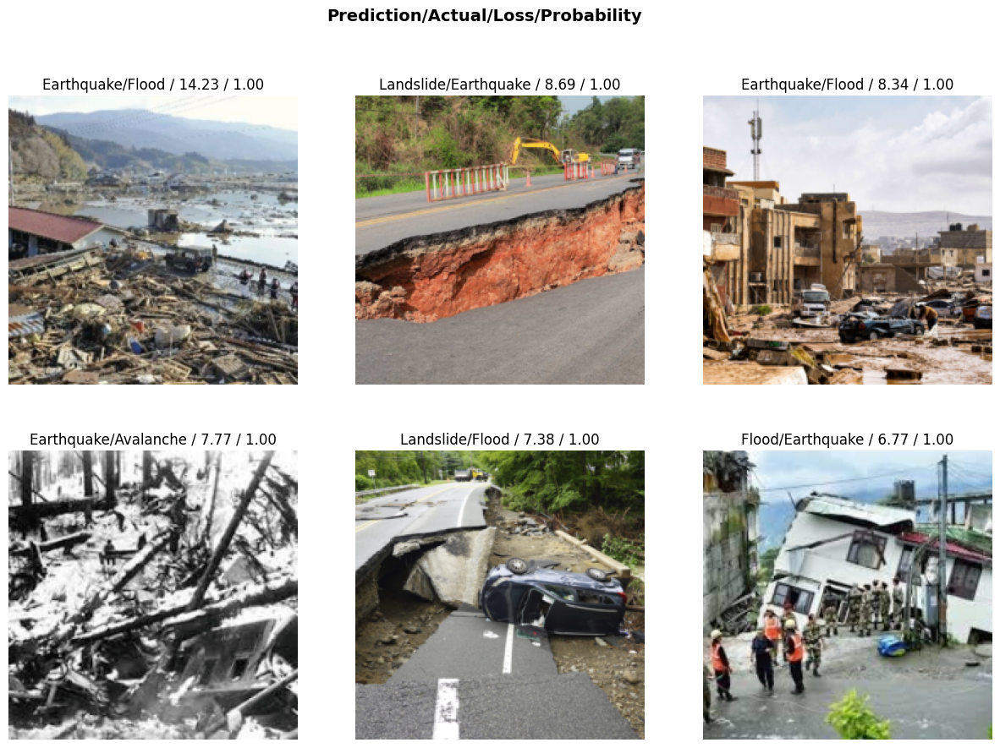

In [ ]:

interp = ClassificationInterpretation.from_learner(learn)

interp.plot_confusion_matrix(figsize=(10,10), dpi=60)

# Plot top 6 losses
interp.plot_top_losses(6, figsize=(15,10))


In [ ]:
img_path = '/content/test_image2.jpeg'  
img = PILImage.create(img_path)
pred_class, pred_idx, outputs = learn.predict(img)
print(f"Predicted Class: {pred_class}")

Predicted Class: Avalanche


In [ ]:
# Export the trained model
learn.export(fname = path/'export2.pkl')
print("Model exported successfully.")


Model exported successfully.


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
import seaborn as sns
import pandas as pd


In [ ]:

preds, targs = learn.get_preds(dl=dls.valid)

preds_np = preds.argmax(dim=1).numpy()
targs_np = targs.numpy()


In [ ]:
from sklearn.metrics import classification_report

report = classification_report(targs_np, preds_np, target_names=dls.vocab, digits=4)
print("Classification Report:\n", report)


Classification Report:
               precision    recall  f1-score   support

   Avalanche     0.9901    0.9524    0.9709       105
  Earthquake     0.8778    0.9518    0.9133        83
        Fire     0.9895    0.9895    0.9895        95
       Flood     0.9823    0.9174    0.9487       121
   Landslide     0.9083    0.9706    0.9384       102
     Tornado     1.0000    0.9796    0.9897        98

    accuracy                         0.9586       604
   macro avg     0.9580    0.9602    0.9584       604
weighted avg     0.9608    0.9586    0.9590       604



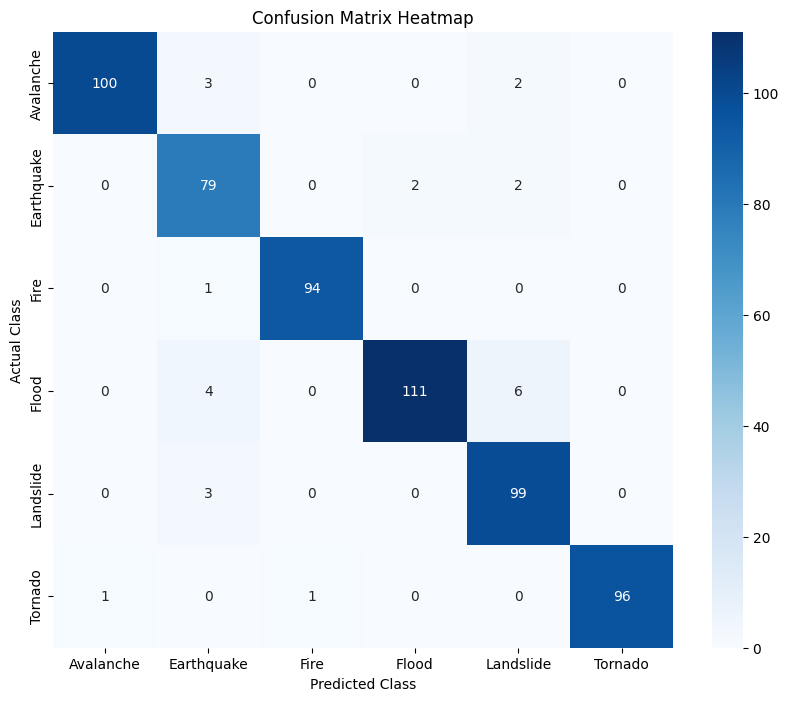

In [ ]:
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(targs_np, preds_np)

cm_df = pd.DataFrame(cm, index=dls.vocab, columns=dls.vocab)

plt.figure(figsize=(10,8))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix Heatmap')
plt.ylabel('Actual Class')
plt.xlabel('Predicted Class')
plt.show()


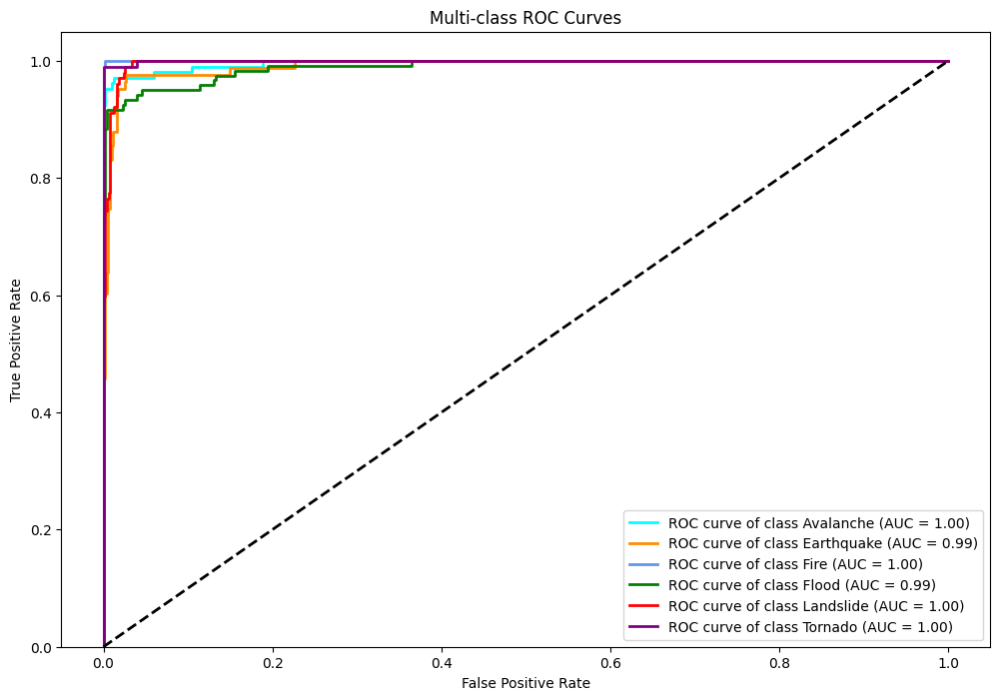

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle
import torch

y_test = label_binarize(targs_np, classes=range(len(dls.vocab)))
n_classes = y_test.shape[1]

y_score = torch.softmax(preds, dim=1).numpy()

fpr, tpr, roc_auc = {}, {}, {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(12, 8))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red', 'purple'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {} (AUC = {:.2f})'.format(dls.vocab[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.05])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curves')
plt.legend(loc="lower right")
plt.show()


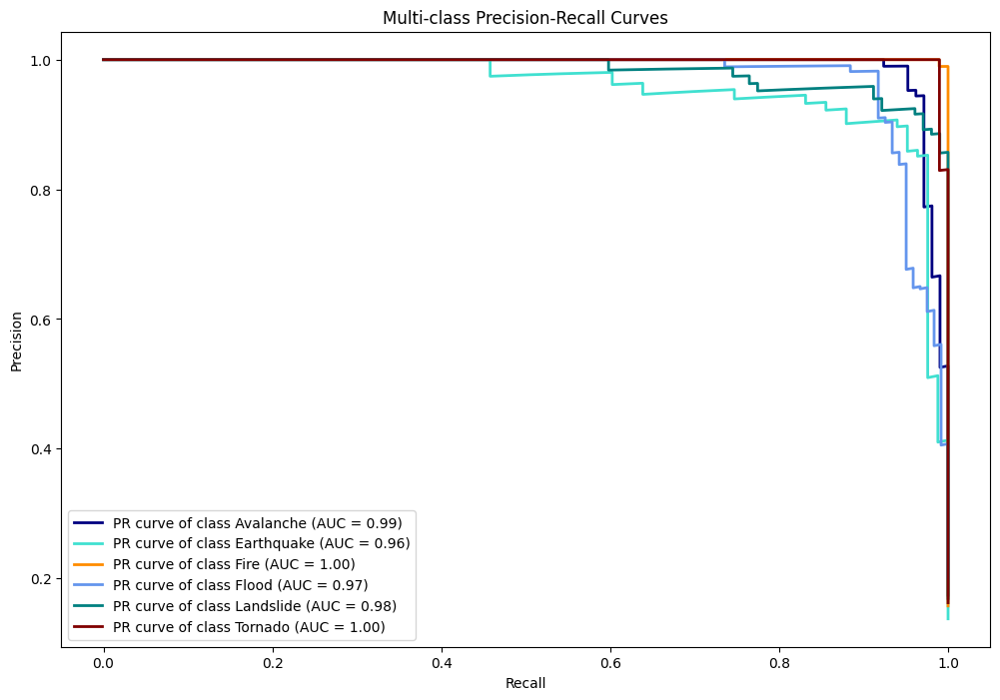

In [ ]:
from sklearn.metrics import precision_recall_curve

precision, recall, average_precision = {}, {}, {}

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test[:, i], y_score[:, i])
    average_precision[i] = auc(recall[i], precision[i])

plt.figure(figsize=(12, 8))
colors = cycle(['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal', 'maroon'])
for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label='PR curve of class {} (AUC = {:.2f})'.format(dls.vocab[i], average_precision[i]))

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Multi-class Precision-Recall Curves')
plt.legend(loc="lower left")
plt.show()


<ipython-input-55-d02417063469>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Class', y='Accuracy', data=acc_df, palette='viridis')


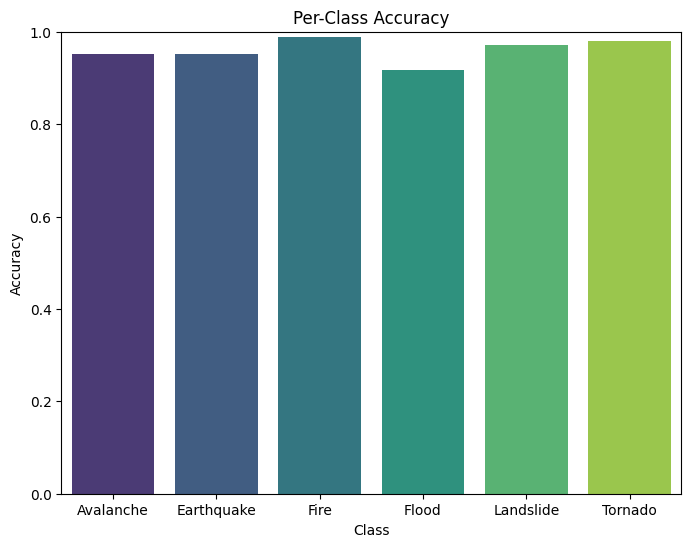

In [ ]:
conf_matrix = confusion_matrix(targs_np, preds_np)
per_class_accuracy = conf_matrix.diagonal() / conf_matrix.sum(axis=1)

acc_df = pd.DataFrame({
    'Class': dls.vocab,
    'Accuracy': per_class_accuracy
})

plt.figure(figsize=(8,6))
sns.barplot(x='Class', y='Accuracy', data=acc_df, palette='viridis')
plt.ylim(0,1)
plt.title('Per-Class Accuracy')
plt.xlabel('Class')
plt.ylabel('Accuracy')
plt.show()


In [ ]:
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef

kappa = cohen_kappa_score(targs_np, preds_np)
mcc = matthews_corrcoef(targs_np, preds_np)
print(f"Cohen's Kappa Score: {kappa:.4f}")
print(f"Matthews Correlation Coefficient: {mcc:.4f}")


Cohen's Kappa Score: 0.9502
Matthews Correlation Coefficient: 0.9505


In [ ]:
learn.export('best_model.pkl')


Saving 01_01_0031.png to 01_01_0031.png
Saving 01_02_0125.png to 01_02_0125.png
Saving 01_02_0127.png to 01_02_0127.png
Saving 03_0034.png to 03_0034.png
Saving 4ecbd2cc-1735-4b59-b938-e8ec9ab33e0f.jpeg to 4ecbd2cc-1735-4b59-b938-e8ec9ab33e0f.jpeg
Saving 05_01_0201.png to 05_01_0201.png
Saving 05_01_0831.png to 05_01_0831.png
Saving 0000016c-b63d-d50e-adfc-f67ff8900000_3x2.jpeg to 0000016c-b63d-d50e-adfc-f67ff8900000_3x2.jpeg
Saving 300px-A_tornado_near_Anadarko%2C_Oklahoma%2C_on_May_3%2C_1999.jpeg to 300px-A_tornado_near_Anadarko%2C_Oklahoma%2C_on_May_3%2C_1999.jpeg
Saving 2023-02-06T141211Z_427143881_RC2N5Z9FIZL1_RTRMADP_3_TURKEY-QUAKE.jpeg to 2023-02-06T141211Z_427143881_RC2N5Z9FIZL1_RTRMADP_3_TURKEY-QUAKE.jpeg
Saving 84788.jpeg to 84788.jpeg
Saving 20230211_BLP502.jpeg to 20230211_BLP502.jpeg
Saving avalanche-500x500.jpeg to avalanche-500x500.jpeg
Saving avalanche-Banner-WordPress-1-768x576.jpeg to avalanche-Banner-WordPress-1-768x576.jpeg
Saving download (14).jpeg to download (14)

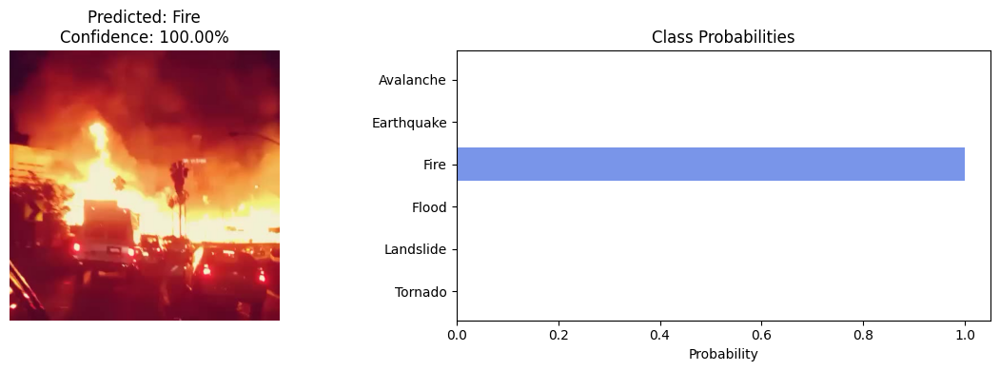


Classifying image: 01_02_0125.png


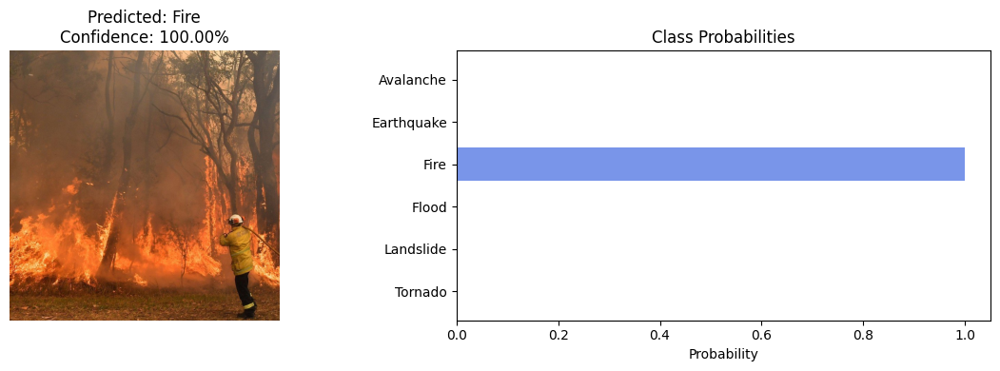


Classifying image: 01_02_0127.png


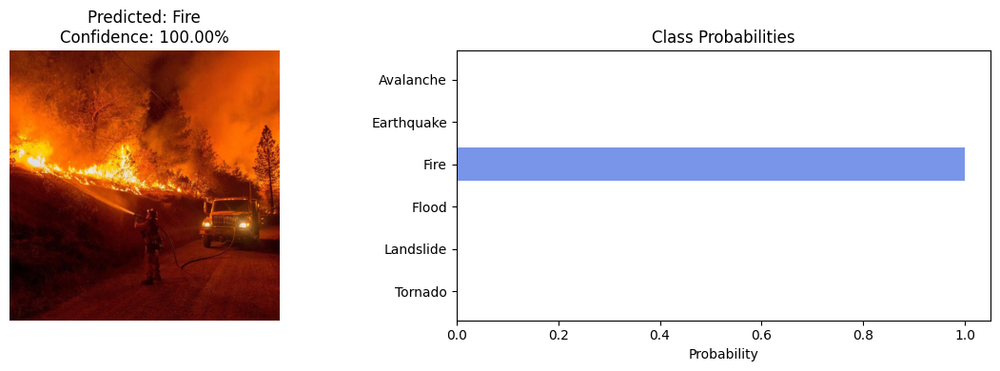


Classifying image: 03_0034.png


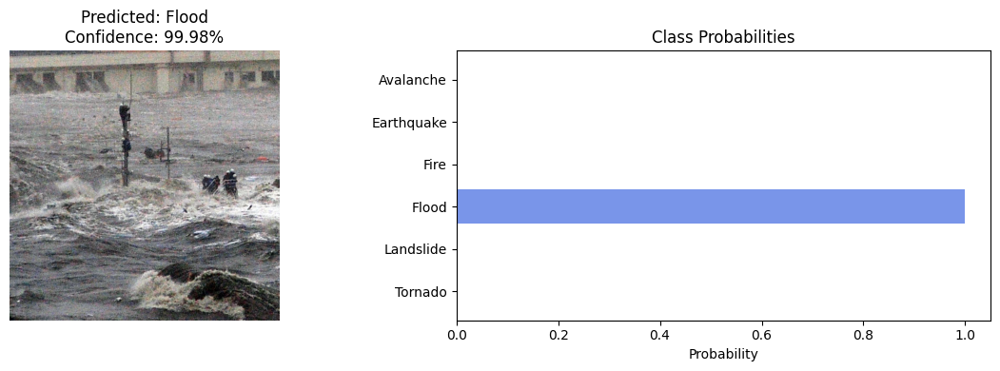


Classifying image: 4ecbd2cc-1735-4b59-b938-e8ec9ab33e0f.jpeg


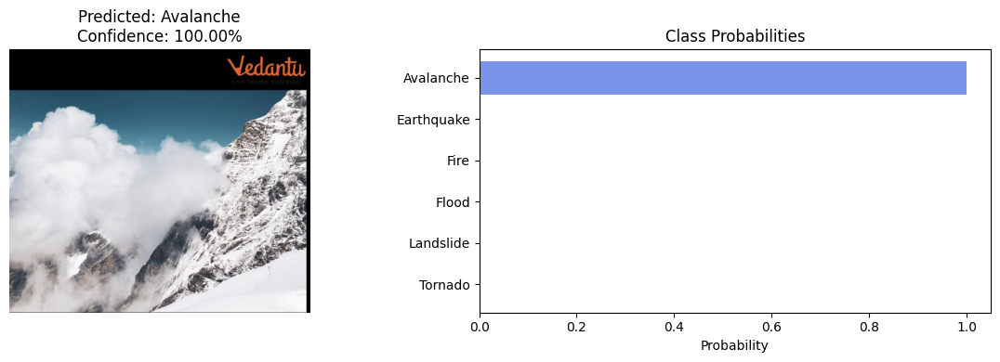


Classifying image: 05_01_0201.png


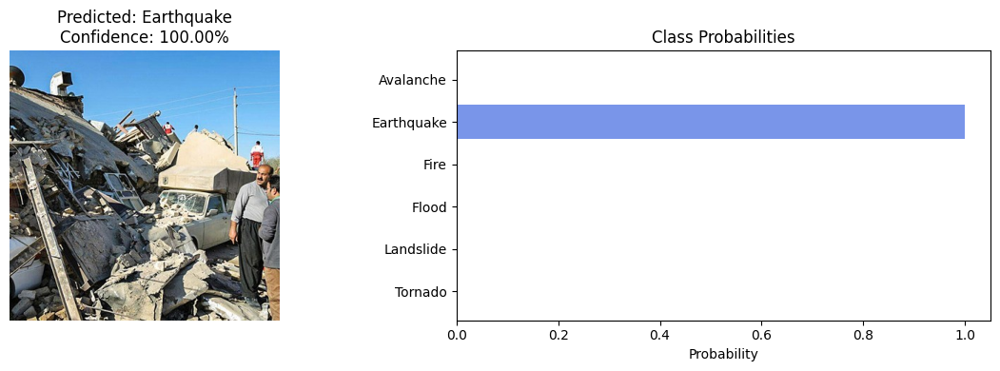


Classifying image: 05_01_0831.png


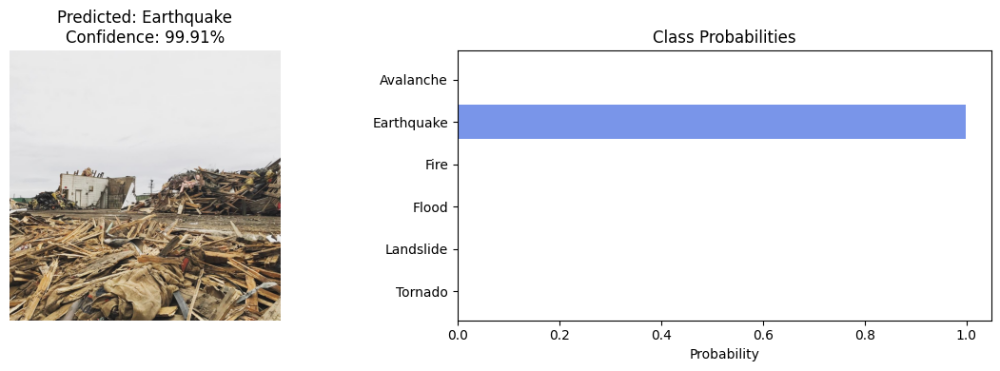


Classifying image: 0000016c-b63d-d50e-adfc-f67ff8900000_3x2.jpeg


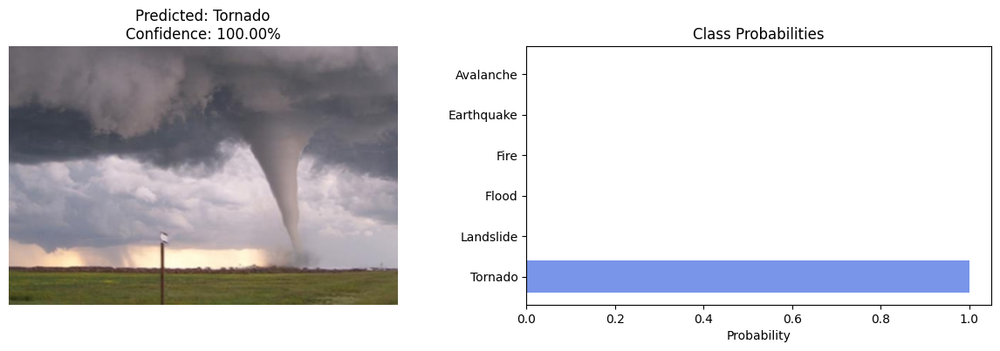


Classifying image: 300px-A_tornado_near_Anadarko%2C_Oklahoma%2C_on_May_3%2C_1999.jpeg


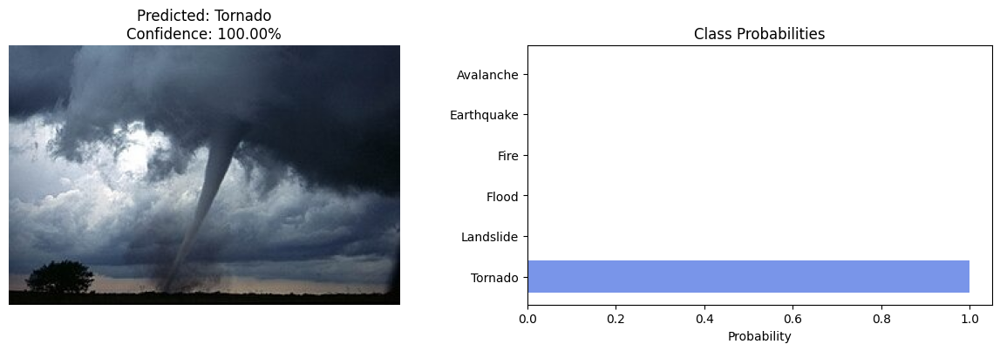


Classifying image: 2023-02-06T141211Z_427143881_RC2N5Z9FIZL1_RTRMADP_3_TURKEY-QUAKE.jpeg


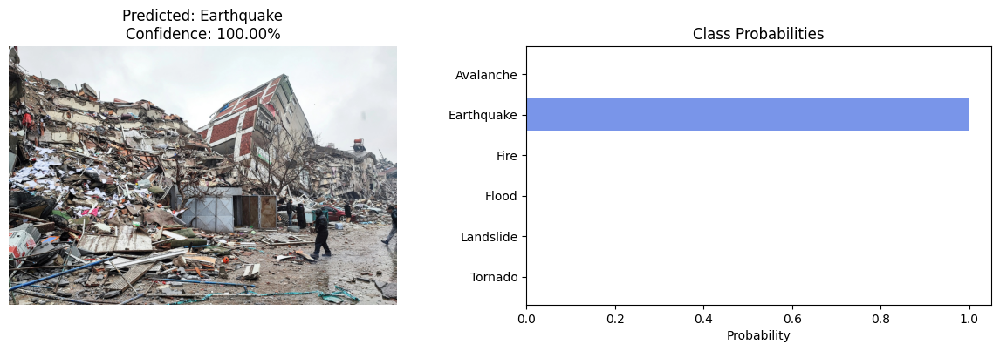


Classifying image: 84788.jpeg


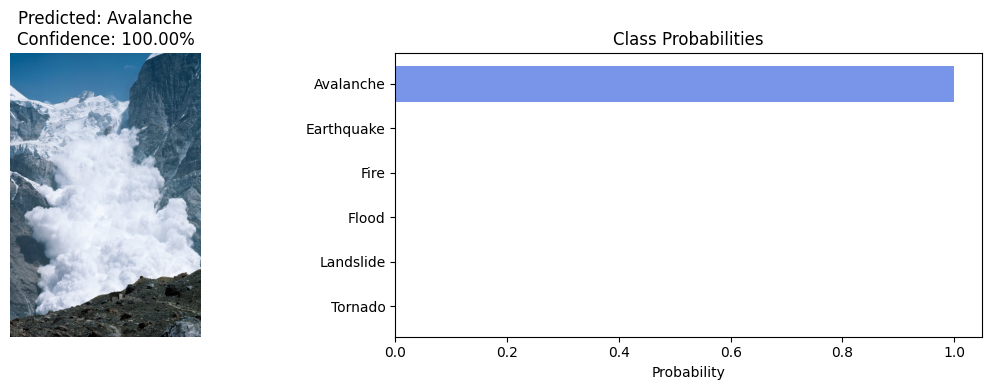


Classifying image: 20230211_BLP502.jpeg


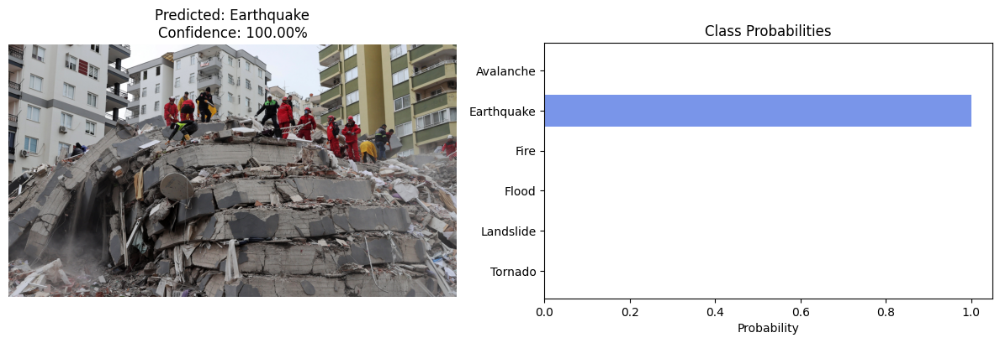


Classifying image: avalanche-500x500.jpeg


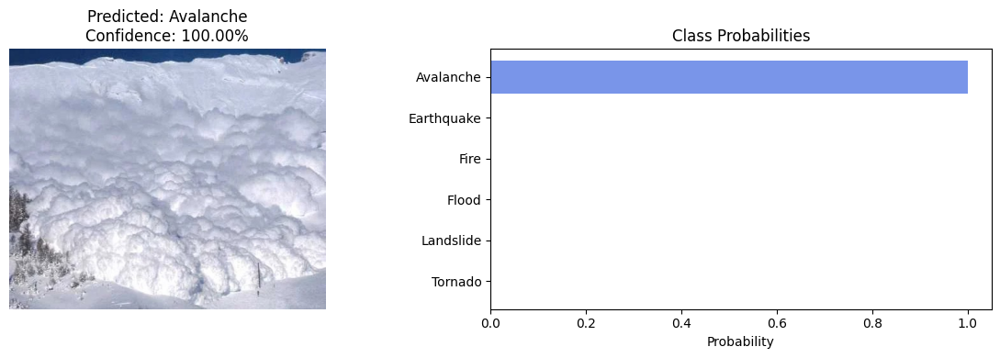


Classifying image: avalanche-Banner-WordPress-1-768x576.jpeg


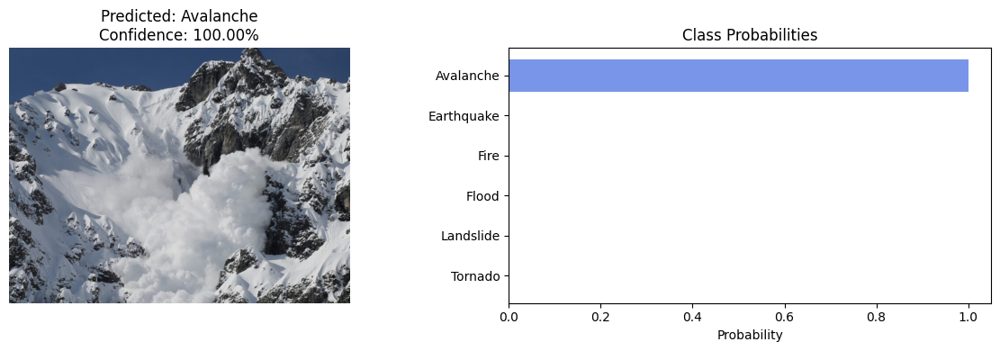


Classifying image: download (14).jpeg


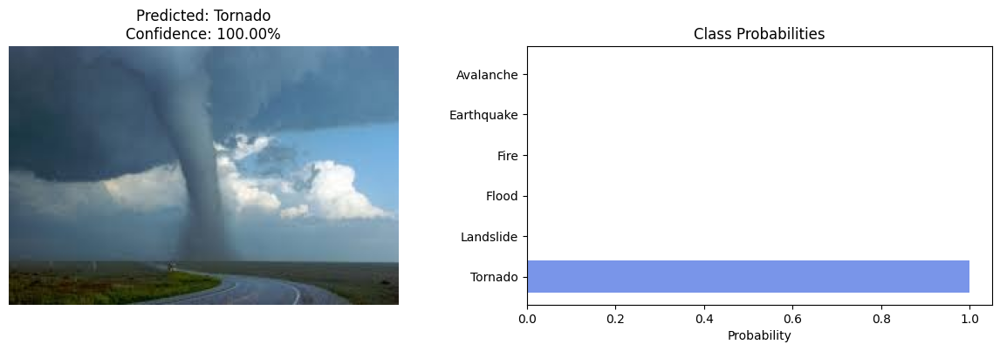


Classifying image: download (17).jpeg


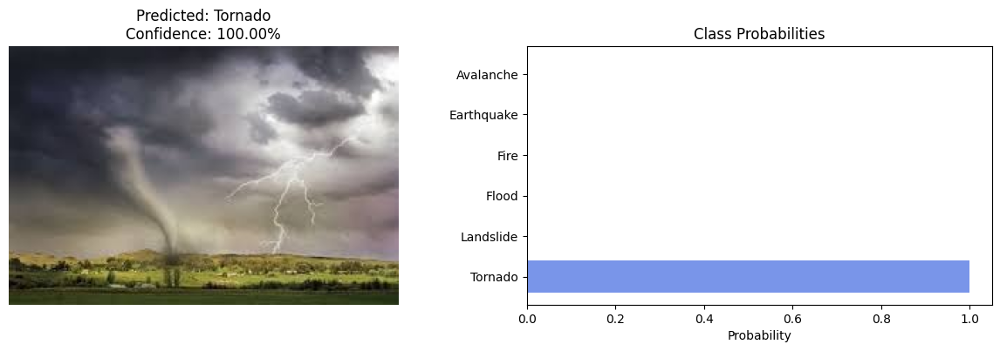


Classifying image: floods (1).jpeg


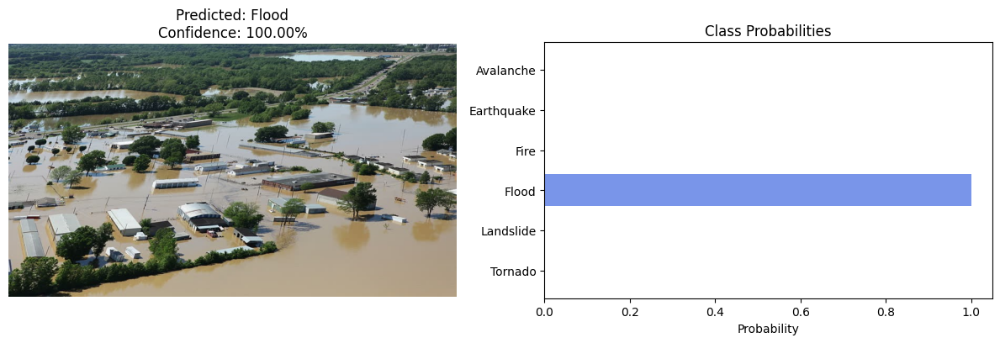


Classifying image: Image_68.jpg


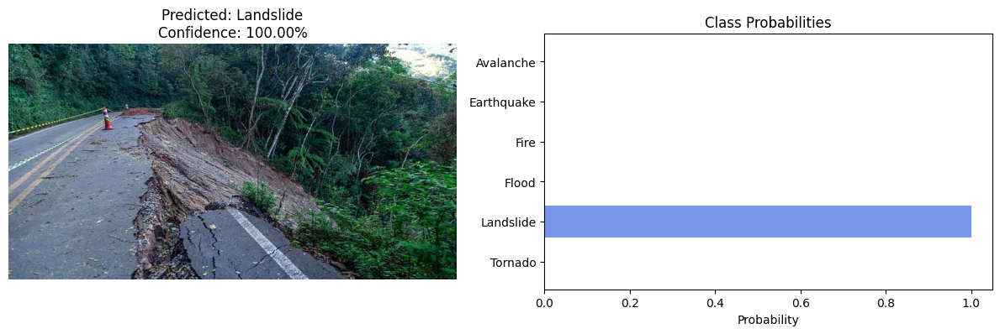


Classifying image: Image_71.jpg


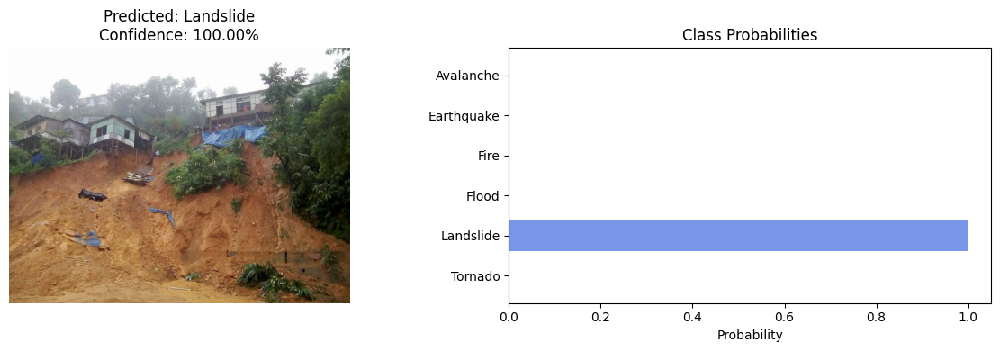


Classifying image: Image_79.jpg


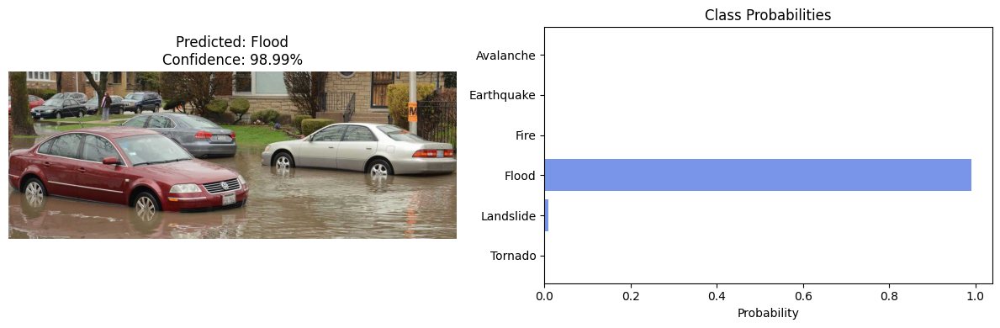


Classifying image: Image_95.jpg


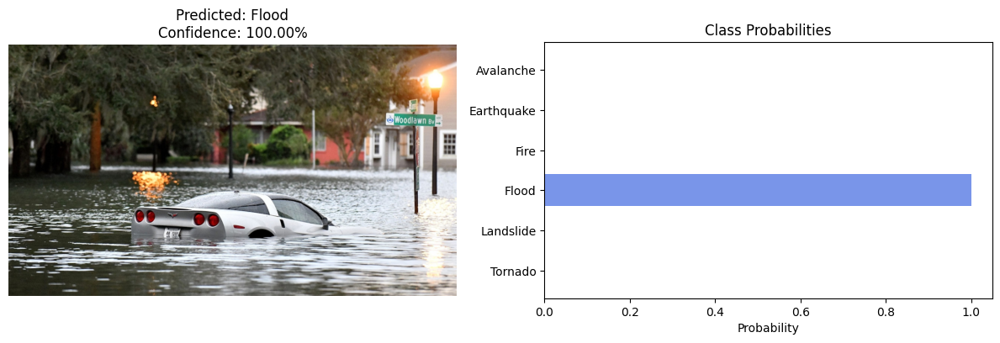


Classifying image: Image_97.jpg


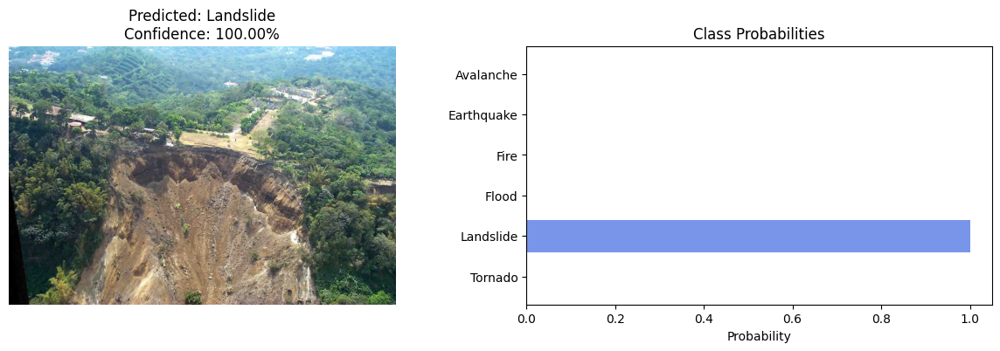


Classifying image: images - 2025-01-09T021812.464.jpeg


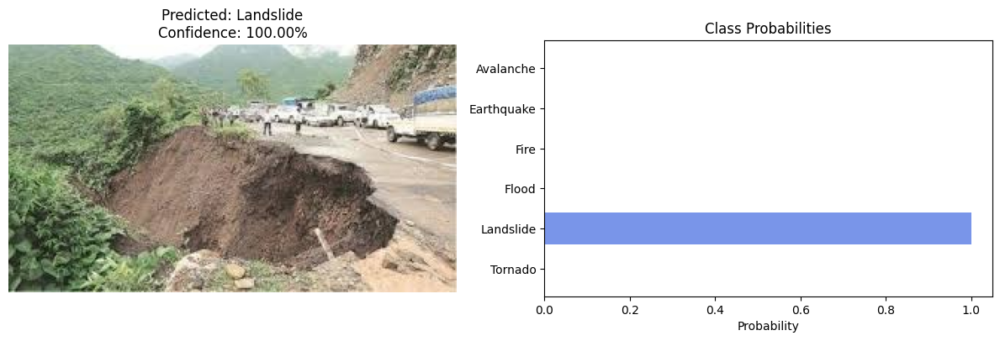


Classifying image: images (26).jpeg


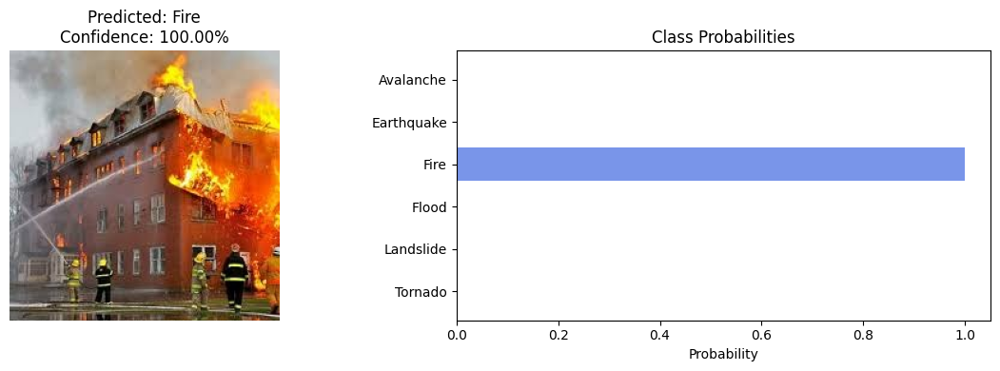

In [ ]:
import io
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from fastai.vision.all import PILImage

%matplotlib inline

def classify_and_visualize(image_file, learn):
    """
    Classify a single image and display:
      1) The image itself,
      2) A bar chart of probabilities for each class,
      3) The predicted class with probability.
    """
    img = PILImage.create(image_file)

    pred_class, pred_idx, outputs = learn.predict(img)

    probs = outputs.numpy()
    class_names = learn.dls.vocab
    top1_prob = probs[pred_idx.item()] * 100.0 
    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {pred_class}\nConfidence: {top1_prob:.2f}%")
    plt.subplot(1,2,2)
    y_pos = np.arange(len(class_names))
    plt.barh(y_pos, probs, align='center', alpha=0.7, color='royalblue')
    plt.yticks(y_pos, class_names)
    plt.xlabel('Probability')
    plt.title('Class Probabilities')
    plt.gca().invert_yaxis()  
    plt.tight_layout()
    plt.show()

uploaded = files.upload()

for file_name in uploaded.keys():
    print(f"\nClassifying image: {file_name}")
    with open(file_name, 'rb') as f:
        image_data = io.BytesIO(f.read())
    classify_and_visualize(image_data, learn)


Saving DALL·E 2025-01-10 03.01.49 - A detailed and realistic depiction of a flood in an urban area. Streets are submerged under murky water, with cars partially underwater and debris flo.webp to DALL·E 2025-01-10 03.01.49 - A detailed and realistic depiction of a flood in an urban area. Streets are submerged under murky water, with cars partially underwater and debris flo.webp

Classifying image: DALL·E 2025-01-10 03.01.49 - A detailed and realistic depiction of a flood in an urban area. Streets are submerged under murky water, with cars partially underwater and debris flo.webp


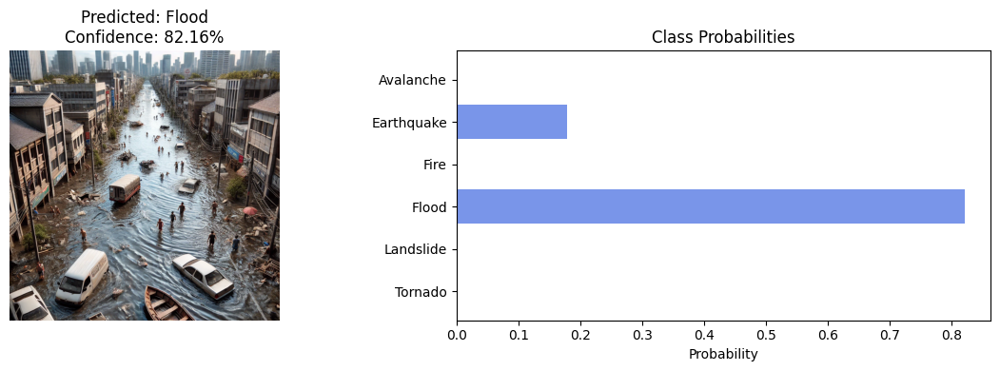

In [63]:
import io
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
from fastai.vision.all import PILImage

%matplotlib inline

def classify_and_visualize(image_file, learn):
    """
    Classify a single image and display:
      1) The image itself,
      2) A bar chart of probabilities for each class,
      3) The predicted class with probability.
    """
    img = PILImage.create(image_file)

    pred_class, pred_idx, outputs = learn.predict(img)

    probs = outputs.numpy()
    class_names = learn.dls.vocab
    top1_prob = probs[pred_idx.item()] * 100.0 
    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Predicted: {pred_class}\nConfidence: {top1_prob:.2f}%")
    plt.subplot(1,2,2)
    y_pos = np.arange(len(class_names))
    plt.barh(y_pos, probs, align='center', alpha=0.7, color='royalblue')
    plt.yticks(y_pos, class_names)
    plt.xlabel('Probability')
    plt.title('Class Probabilities')
    plt.gca().invert_yaxis()  
    plt.tight_layout()
    plt.show()

uploaded = files.upload()

for file_name in uploaded.keys():
    print(f"\nClassifying image: {file_name}")
    with open(file_name, 'rb') as f:
        image_data = io.BytesIO(f.read())
    classify_and_visualize(image_data, learn)
